<a href="https://colab.research.google.com/github/N0elle-08/MScDataScience/blob/main/TransferLearning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning - Image Classification
## *Comparison ResNet50 vs VGG16 vs InceptionV3*

# Load Dataset

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"charmainenoelle","key":"17b2142a630cd88abe38bcf8b7277772"}'}

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d umairshahpirzada/birds-20-species-image-classification -p /content


 98% 68.0M/69.3M [00:03<00:00, 26.5MB/s]
100% 69.3M/69.3M [00:03<00:00, 23.5MB/s]


In [ ]:
import zipfile

with zipfile.ZipFile('/content/birds-20-species-image-classification.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/20birdspecies')

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

#tensorflow
import tensorflow as tf
from tensorflow.python import keras
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Add, Dense, Dropout, Activation, ZeroPadding2D, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D, BatchNormalization
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
from tensorflow.keras.optimizers import Adam, RMSprop
from torchvision import transforms, datasets, models
from torch.utils.data import random_split, DataLoader
from torchvision.datasets import ImageFolder

#visualization
from matplotlib.pyplot import imshow
import cv2

In [ ]:
train_path = '/content/20birdspecies/train'
val_path = '/content/20birdspecies/valid'
test_path = '/content/20birdspecies/test'

In [ ]:
BATCH_SIZE = 10
IMAGE_SIZE = (150,150)

In [ ]:
transformation = transforms.Compose([
    transforms.Resize((150, 150)),
    # transforms.RandomHorizontalFlip(),
    # transforms.RandomRotation(10),
    # transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor()
    # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
dataset = ImageFolder(root=train_path, transform=transformation)

# Data Visualisation & Preprocessing
We visualizes the distribution of data points across different classes,
to understand the balance or imbalance within the dataset. It's crucial in machine learning to ensure equal representation of classes for effective model training, diagnosing potential biases, and determining if certain classes have significantly fewer or more samples compared to others, which might impact the model's performance.

<ipython-input-9-7d212b1190a0>:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(keys, rotation=45, ha='right')


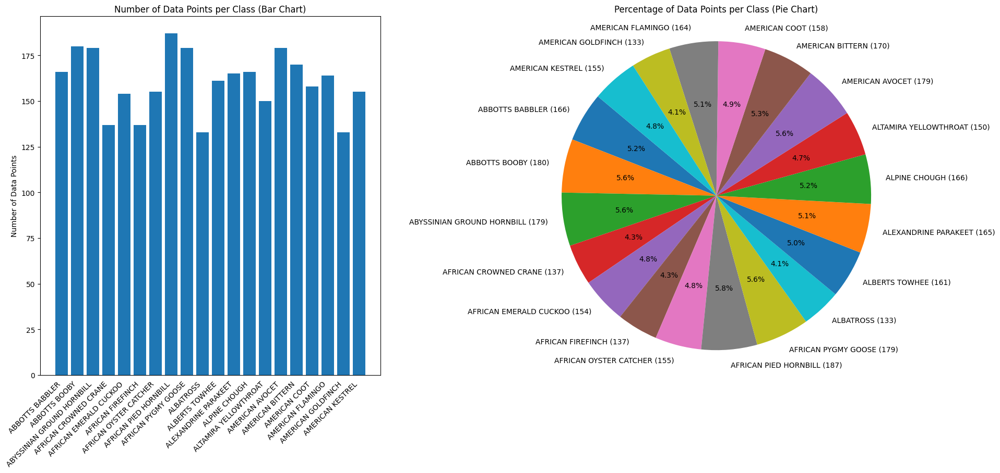

In [ ]:
class_to_idx = dataset.class_to_idx
from collections import Counter
mapped_values = [Counter(dataset.targets)[class_to_idx[key]] for key in class_to_idx]

keys = list(class_to_idx.keys())
labels = [f'{key} ({value})' for key, value in zip(keys, mapped_values)]


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.bar(keys, mapped_values)
ax1.set_ylabel('Number of Data Points')
ax1.set_title('Number of Data Points per Class (Bar Chart)')
ax1.set_xticklabels(keys, rotation=45, ha='right')
ax1.tick_params(axis='x', which='both', bottom=False)


ax2.pie(mapped_values, labels=labels, autopct='%1.1f%%', startangle=140)
ax2.set_title('Percentage of Data Points per Class (Pie Chart)')
ax2.axis('equal')


plt.tight_layout(pad=4.0)


plt.show()



The bar chart shows the number of data points per class and the pie chart shows the percentage of data points per class. It suggests we have an almost balanced dataset.

The *ImageDataGenerator* helps preprocess images by rescaling their pixel values, which typically range from 0 to 255, to a smaller range (0 to 1) for easier processing. Using *flow_from_directory*, it allows for easy feeding of batches of images from directories during the training, testing, and validation phases in a machine learning model. This process handles various operations like resizing images to a specified target size, setting batch sizes, shuffling data for randomness, and preparing labels in a categorical format, which is crucial for training deep learning models on image data.

In [ ]:
# Rescale
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)
valid_datagen = ImageDataGenerator(rescale = 1./255)



# data transfer from directories to batches
train_data = train_datagen.flow_from_directory(directory = train_path,
                                               batch_size= BATCH_SIZE,
                                               target_size= IMAGE_SIZE,
                                               shuffle=True,
                                               class_mode = "categorical")

test_data = test_datagen.flow_from_directory(directory = val_path,
                                               batch_size = BATCH_SIZE,
                                               target_size = IMAGE_SIZE,
                                               shuffle=False,
                                               class_mode = "categorical")

val_data = valid_datagen.flow_from_directory(directory = test_path,
                                               batch_size = BATCH_SIZE,
                                               target_size = IMAGE_SIZE,
                                               class_mode = "categorical",
                                               shuffle = False)

Found 3208 images belonging to 20 classes.
Found 100 images belonging to 20 classes.
Found 100 images belonging to 20 classes.


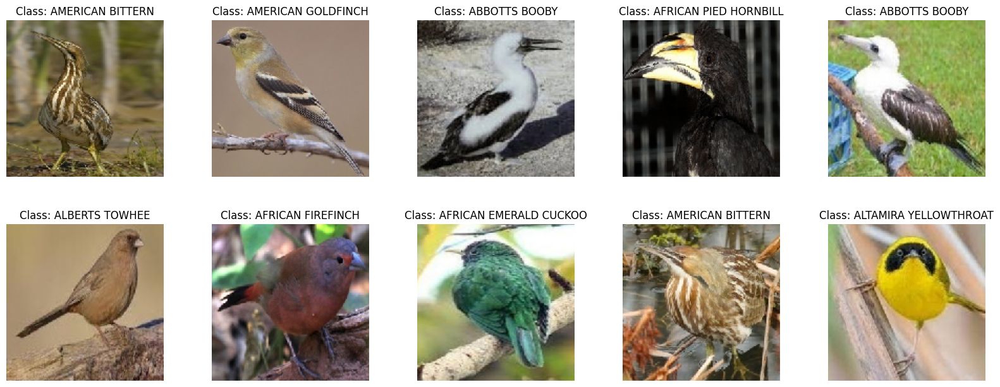

In [ ]:
labels = [k for k in train_data.class_indices]
sample_generate = train_data.__next__()

images = sample_generate[0]
titles = sample_generate[1]
plt.figure(figsize = (20 , 20))

for i in range(10):
    plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(hspace = 0.3 , wspace = 0.3)
    plt.imshow(images[i])
    plt.title(f'Class: {labels[np.argmax(titles[i],axis=0)]}')
    plt.axis("off")

#Models

## ResNet50
The **base ResNet-50 model** is imported with weights pre-trained on ImageNet. This model is known for its deep architecture with skip connections, enabling effective feature extraction from images.The original fully connected layers of the ResNet-50 model are excluded inorder to include our own layers.We then directly sets the last 100 layers of the base ResNet-50 model as trainable after initially freezing all layers. This method allows for fine-tuning only the last segment of the model, leaving the earlier layers with their pre-trained weights intact. We unfreeze the 1st 10 layers.

For transfer learning, the layers of the pre-trained ResNet-50 model are frozen (layer.trainable = False). This means their weights are not updated during training, preserving the learned features from ImageNet. Freezing prevents the model from excessively adjusting the pre-trained weights, especially beneficial when dealing with limited data.

**Custom Added Layers**

Global Average Pooling: After the base layers, a Global Average Pooling layer is added. It reduces the spatial dimensions of the previous layer to a vector of averages, summarizing the important features extracted by the convolutional layers.

Dense Layer (512 units, ReLU Activation): A Dense layer with 512 units and ReLU activation follows the Global Average Pooling. This layer acts as a bottleneck, capturing more abstract and high-level features learned from the data.

Dropout Layer (0.2): Dropout is added for regularization. It randomly sets a fraction of input units to zero during training, helping prevent overfitting by providing a form of ensemble learning and reducing interdependence among neurons.

Dense Output Layer (num_classes, Softmax Activation): Finally, a Dense output layer is added with a number of units equal to the number of classes in the dataset, using softmax activation to produce class probabilities for classification.

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.applications import ResNet50
import os

def create_custom_resnet50(num_classes, input_shape):
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

    for layer in base_model.layers:
        layer.trainable = False  # Freeze the layers to retain pre-trained weights

    for layer in base_model.layers[:10]:
        layer.trainable = True

    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.2)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=predictions)
    return model

num_classes = len(os.listdir('/content/20birdspecies/train'))
input_shape = (150, 150, 3)


resnet50_model = create_custom_resnet50(num_classes, input_shape)


94765736/94765736 [==============================] - 3s 0us/step


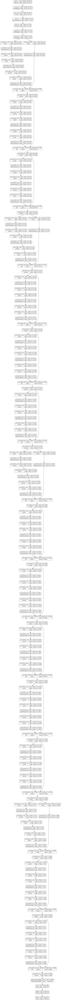

In [ ]:
#for layer in resnet50_model.layers[-100:]:
 #   layer.trainable = True
from keras.utils import plot_model

plot_model(resnet50_model, to_file='inception.png', show_shapes=True)

In [ ]:
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

callback = tf.keras.callbacks.LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)


In [ ]:

opt = Adam(learning_rate=0.0001)
resnet50_model.compile(optimizer=opt, loss=keras.losses.categorical_crossentropy, metrics=['accuracy'])


history_resnet50 = resnet50_model.fit(
    train_data,
    validation_data=val_data,
    epochs=10,
    steps_per_epoch=train_data.samples // BATCH_SIZE,
    validation_steps=val_data.samples // BATCH_SIZE,
    callbacks=[callback, early_stopping]
)




Epoch 1/10
320/320 [==============================] - 44s 72ms/step - loss: 1.0082 - accuracy: 0.7164 - val_loss: 3.1348 - val_accuracy: 0.0600 - lr: 1.0000e-04
Epoch 2/10
320/320 [==============================] - 19s 58ms/step - loss: 0.2692 - accuracy: 0.9237 - val_loss: 1.8465 - val_accuracy: 0.4300 - lr: 1.0000e-04
Epoch 3/10
320/320 [==============================] - 20s 63ms/step - loss: 0.1636 - accuracy: 0.9509 - val_loss: 0.2998 - val_accuracy: 0.9000 - lr: 1.0000e-04
Epoch 4/10
320/320 [==============================] - 19s 59ms/step - loss: 0.1081 - accuracy: 0.9681 - val_loss: 0.0737 - val_accuracy: 0.9700 - lr: 1.0000e-04
Epoch 5/10
320/320 [==============================] - 19s 59ms/step - loss: 0.0780 - accuracy: 0.9797 - val_loss: 0.0414 - val_accuracy: 1.0000 - lr: 1.0000e-04
Epoch 6/10
320/320 [==============================] - 19s 61ms/step - loss: 0.0528 - accuracy: 0.9894 - val_loss: 0.0470 - val_accuracy: 0.9900 - lr: 1.0000e-04
Epoch 7/10
320/320 [==============

##VGG16
We import the VGG16 model pre-trained on ImageNet without its final classification layers. This enables the utilization of VGG16's learned image features. We freeze these pre-trained layers to retain their learned representations, preventing updates during training.

The customisation is as follows, we adds a Flatten layer to convert the output of the VGG16 convolutional layers into a one-dimensional array. This step prepares the data for classification.
A Dense layer with a softmax activation function is appended. This layer is responsible for the final classification into the specified number of classes in the dataset.

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense

def create_vgg16_model(input_shape, num_classes):

    vgg16 = VGG16(input_shape=input_shape, weights='imagenet', include_top=False)

    # Freeze the pre-trained weights
    for layer in vgg16.layers:
        layer.trainable = False

    x = Flatten()(vgg16.output)
    x = Dropout(0.2)(x)
    x = Dense(1024, activation='relu')(x)

    x = Dropout(0.25)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=vgg16.input, outputs=predictions)

    return model

input_shape = (150, 150, 3)
num_classes = len(os.listdir('/content/20birdspecies/train'))

vgg16_model1 = create_vgg16_model(input_shape, num_classes)

optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=0.0001)

for layer in vgg16_model1.layers[-5:]:
    layer.trainable = True

vgg16_model1.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',  patience=3, restore_best_weights=True
)


# Display the model summary
vgg16_model1.summary()




Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0   

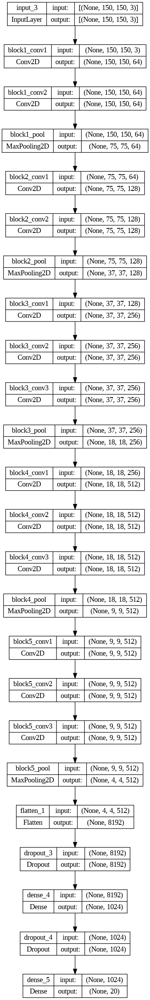

In [ ]:

plot_model(vgg16_model1, to_file='VGG16.png', show_shapes=True)

In [ ]:
history_vgg16 = vgg16_model1.fit(
    train_data,
    validation_data=val_data,
    epochs=10,
    steps_per_epoch=train_data.samples // BATCH_SIZE,
    validation_steps=val_data.samples // BATCH_SIZE,
    callbacks=[callback, early_stopping]  # Add your callbacks here
)


Epoch 1/10
320/320 [==============================] - 13s 36ms/step - loss: 1.7266 - accuracy: 0.5016 - val_loss: 0.6467 - val_accuracy: 0.8300 - lr: 1.0000e-04
Epoch 2/10
320/320 [==============================] - 11s 34ms/step - loss: 0.7050 - accuracy: 0.7942 - val_loss: 0.4403 - val_accuracy: 0.8600 - lr: 1.0000e-04
Epoch 3/10
320/320 [==============================] - 11s 33ms/step - loss: 0.4111 - accuracy: 0.8865 - val_loss: 0.3801 - val_accuracy: 0.9200 - lr: 1.0000e-04
Epoch 4/10
320/320 [==============================] - 11s 34ms/step - loss: 0.2610 - accuracy: 0.9331 - val_loss: 0.2432 - val_accuracy: 0.9400 - lr: 1.0000e-04
Epoch 5/10
320/320 [==============================] - 11s 35ms/step - loss: 0.1810 - accuracy: 0.9528 - val_loss: 0.2725 - val_accuracy: 0.9500 - lr: 1.0000e-04
Epoch 6/10
320/320 [==============================] - 11s 33ms/step - loss: 0.1206 - accuracy: 0.9750 - val_loss: 0.2886 - val_accuracy: 0.9300 - lr: 1.0000e-04
Epoch 7/10
320/320 [==============

## InceptionV3
After the InceptionV3 convolutional base, we append the below layers for fine-tuning:

Flatten: Flattens the output to transform it into a one-dimensional tensor.
s
Dense (1024 neurons, ReLU): Adding a densely connected layer with ReLU activation and L2 regularization to learn higher-level features.

Dropout (0.4): Introducing dropout for regularization, randomly setting 40% of the input units to 0 during training to prevent overfitting.

Dense (n_categories, softmax): A final Dense layer with softmax activation, producing class probabilities for the 20 classes

After constructing the model, we further customizes the model by unfreezing a subset of the top layers for fine-tuning. Specifically, it sets the trainable attribute to True for the first 100 layers. This allows these layers to adapt and learn task-specific features from the dataset during subsequent training.

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, 150, 150, 3)]        0         []                            
                                                                                                  
 conv2d_470 (Conv2D)         (None, 74, 74, 32)           864       ['input_9[0][0]']             
                                                                                                  
 batch_normalization_470 (B  (None, 74, 74, 32)           96        ['conv2d_470[0][0]']          
 atchNormalization)                                                                               
                                                                                                  
 activation_470 (Activation  (None, 74, 74, 32)           0         ['batch_normalization_47

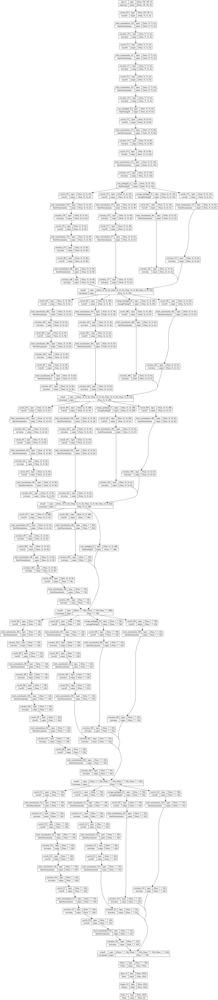

In [ ]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, Input
from keras.utils import plot_model
from tensorflow.keras.layers import Input, Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import InceptionV3
import tensorflow as tf
import os

def inception(input_shape, n_categories):
    input_tensor = Input(shape=input_shape)
    base_model = InceptionV3(weights='imagenet', include_top=False, input_tensor=input_tensor)

    for layer in base_model.layers:
       layer.trainable = False  # Freeze the layers to retain pre-trained weights

    # Unfreeze some layers for fine-tuning
    for layer in base_model.layers[-10:]:
        layer.trainable = True

    last_layer = base_model.get_layer('mixed5')
    x = last_layer.output
    x = Flatten()(x)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(0.4)(x)
    x = Dense(n_categories, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=x)

    return model

n_categories = len(os.listdir('/content/20birdspecies/train'))

input_shape = (150, 150, 3)  # Adjust based on your input image shape
model_IV3 = inception(input_shape, n_categories )
model_IV3.summary()
plot_model(model_IV3, to_file='inception.png', show_shapes=True)


In [ ]:
from keras.optimizers import Adam
opt = Adam(learning_rate=0.0001)

model_IV3.compile(optimizer=opt, loss=keras.losses.categorical_crossentropy, metrics=['accuracy'])
history_IV3 = model_IV3.fit(
            train_data,
            validation_data = val_data,
            epochs = 10,
            steps_per_epoch=train_data.samples // BATCH_SIZE,
            validation_steps=val_data.samples // BATCH_SIZE,
            callbacks=[callback, early_stopping])

Epoch 1/10
320/320 [==============================] - 31s 50ms/step - loss: 1.1151 - accuracy: 0.6739 - val_loss: 0.2807 - val_accuracy: 0.9200 - lr: 1.0000e-04
Epoch 2/10
320/320 [==============================] - 15s 47ms/step - loss: 0.1587 - accuracy: 0.9503 - val_loss: 0.0763 - val_accuracy: 0.9800 - lr: 1.0000e-04
Epoch 3/10
320/320 [==============================] - 15s 46ms/step - loss: 0.0874 - accuracy: 0.9737 - val_loss: 0.1506 - val_accuracy: 0.9500 - lr: 1.0000e-04
Epoch 4/10
320/320 [==============================] - 15s 48ms/step - loss: 0.0642 - accuracy: 0.9806 - val_loss: 0.0709 - val_accuracy: 0.9500 - lr: 1.0000e-04
Epoch 5/10
320/320 [==============================] - 15s 46ms/step - loss: 0.0617 - accuracy: 0.9784 - val_loss: 0.2420 - val_accuracy: 0.9300 - lr: 1.0000e-04
Epoch 6/10
320/320 [==============================] - 15s 47ms/step - loss: 0.1125 - accuracy: 0.9656 - val_loss: 0.2082 - val_accuracy: 0.9300 - lr: 1.0000e-04
Epoch 7/10
320/320 [==============

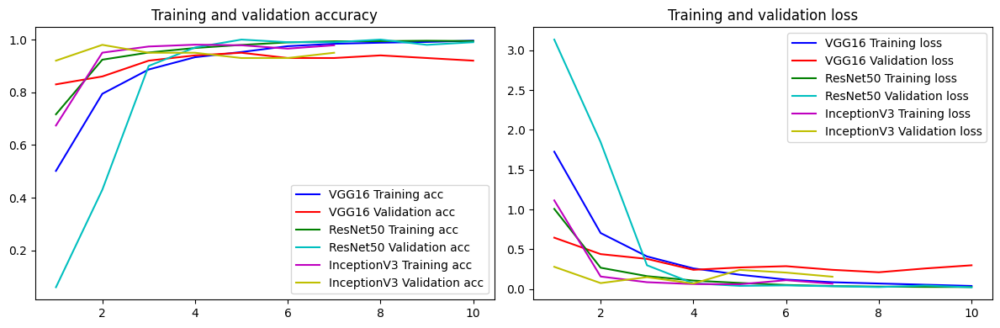

In [ ]:
# Find the maximum number of epochs among all models
import matplotlib.pyplot as plt

# Extracting training/validation accuracy and loss for each model
vgg16_acc = history_vgg16.history['accuracy']
vgg16_val_acc = history_vgg16.history['val_accuracy']
vgg16_loss = history_vgg16.history['loss']
vgg16_val_loss = history_vgg16.history['val_loss']

resnet50_acc = history_resnet50.history['accuracy']
resnet50_val_acc = history_resnet50.history['val_accuracy']
resnet50_loss = history_resnet50.history['loss']
resnet50_val_loss = history_resnet50.history['val_loss']

inceptionv3_acc = history_IV3.history['accuracy']
inceptionv3_val_acc = history_IV3.history['val_accuracy']
inceptionv3_loss = history_IV3.history['loss']
inceptionv3_val_loss = history_IV3.history['val_loss']

max_epochs = max(len(vgg16_acc), len(resnet50_acc), len(inceptionv3_acc))

# Adjusting epochs range
epochs = range(1, max_epochs + 1)

# Plotting accuracy
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs[:len(vgg16_acc)], vgg16_acc, 'b', label='VGG16 Training acc')
plt.plot(epochs[:len(vgg16_val_acc)], vgg16_val_acc, 'r', label='VGG16 Validation acc')
plt.plot(epochs[:len(resnet50_acc)], resnet50_acc, 'g', label='ResNet50 Training acc')
plt.plot(epochs[:len(resnet50_val_acc)], resnet50_val_acc, 'c', label='ResNet50 Validation acc')
plt.plot(epochs[:len(inceptionv3_acc)], inceptionv3_acc, 'm', label='InceptionV3 Training acc')
plt.plot(epochs[:len(inceptionv3_val_acc)], inceptionv3_val_acc, 'y', label='InceptionV3 Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

# Plotting loss
plt.subplot(1, 2, 2)
plt.plot(epochs[:len(vgg16_loss)], vgg16_loss, 'b', label='VGG16 Training loss')
plt.plot(epochs[:len(vgg16_val_loss)], vgg16_val_loss, 'r', label='VGG16 Validation loss')
plt.plot(epochs[:len(resnet50_loss)], resnet50_loss, 'g', label='ResNet50 Training loss')
plt.plot(epochs[:len(resnet50_val_loss)], resnet50_val_loss, 'c', label='ResNet50 Validation loss')
plt.plot(epochs[:len(inceptionv3_loss)], inceptionv3_loss, 'm', label='InceptionV3 Training loss')
plt.plot(epochs[:len(inceptionv3_val_loss)], inceptionv3_val_loss, 'y', label='InceptionV3 Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.tight_layout()
plt.show()


The results above show that all three models have similar training and validation accuracy, but the InceptionV3 model has a lower training and validation loss compared to the other two models.

1/1 [==============================] - 2s 2s/step


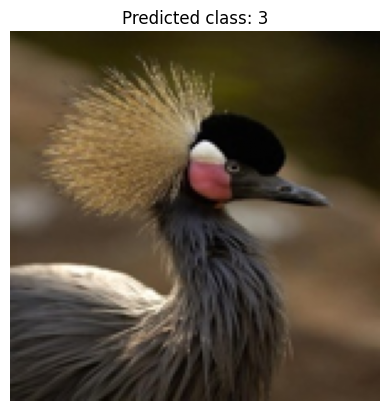

In [ ]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

image_directory = '/content/20birdspecies/images to predict'
img_size = 150

images = []
for filename in os.listdir(image_directory):
    path = os.path.join(image_directory, filename)
    img = Image.open(path)
    img = img.resize((img_size, img_size))
    images.append(img)

images = np.array([np.array(img) for img in images])
images = images / 255.0

predictions = model_IV3.predict(images)

# Select image to display
img_index = 0

# Get predicted class label
class_label = np.argmax(predictions[img_index])

# Display image and predicted class label
plt.imshow(images[img_index])
plt.axis('off')
plt.title('Predicted class: ' + str(class_label))
plt.show()

In [ ]:
#misc
import os.path
from pathlib import Path
image_dir = Path(test_path)

filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.png')) + list(image_dir.glob(r'**/*.png'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

test_df = pd.concat([filepaths, labels], axis=1)
test_df = test_df.sort_values(by='Filepath')
print(test_df.shape)
test_df.head()

(100, 2)


,Filepath,Label
53,/content/20birdspecies/test/ABBOTTS BABBLER/1.jpg,ABBOTTS BABBLER
52,/content/20birdspecies/test/ABBOTTS BABBLER/2.jpg,ABBOTTS BABBLER
54,/content/20birdspecies/test/ABBOTTS BABBLER/3.jpg,ABBOTTS BABBLER
51,/content/20birdspecies/test/ABBOTTS BABBLER/4.jpg,ABBOTTS BABBLER
50,/content/20birdspecies/test/ABBOTTS BABBLER/5.jpg,ABBOTTS BABBLER


Processing VGG16
10/10 [==============================] - 1s 40ms/step


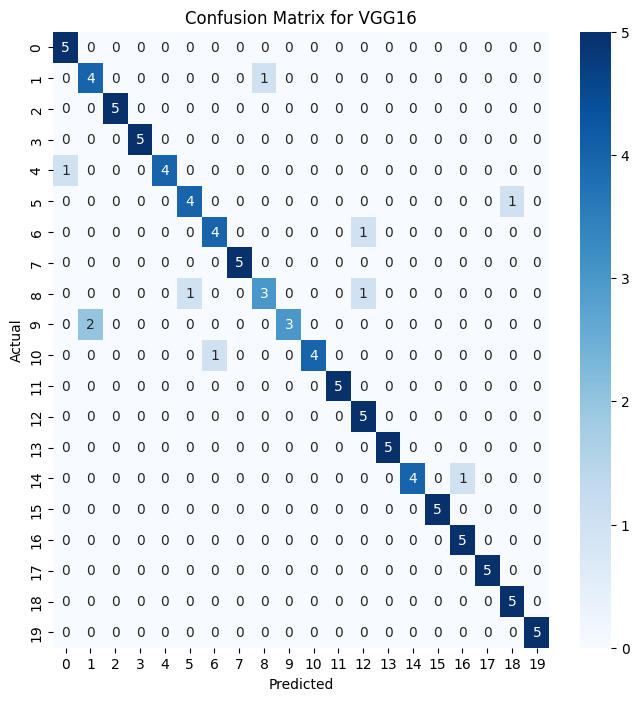

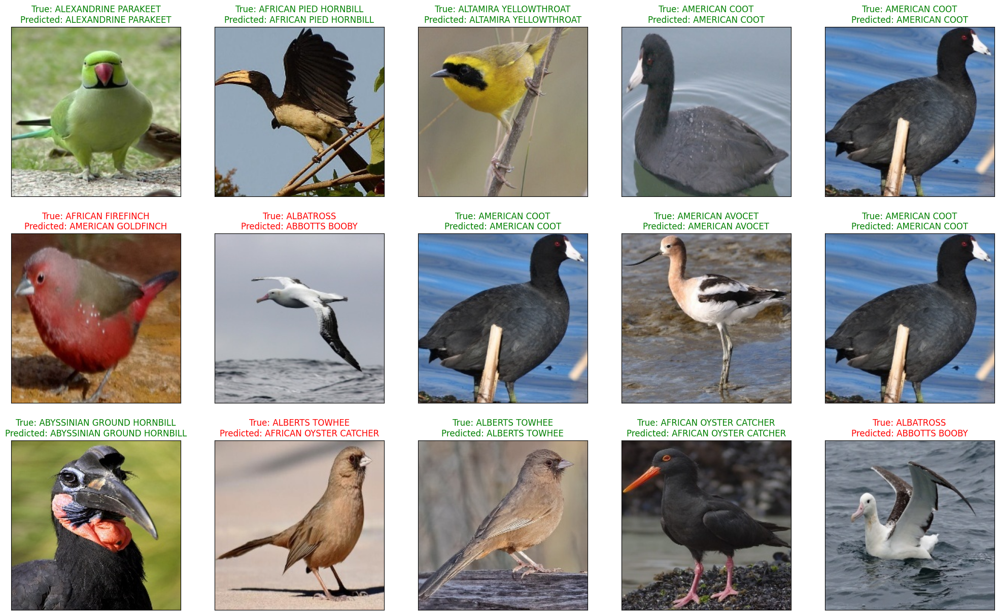

Classification Report for VGG16:
              precision    recall  f1-score   support

           0       0.83      1.00      0.91         5
           1       0.67      0.80      0.73         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      0.80      0.89         5
           5       0.80      0.80      0.80         5
           6       0.80      0.80      0.80         5
           7       1.00      1.00      1.00         5
           8       0.75      0.60      0.67         5
           9       1.00      0.60      0.75         5
          10       1.00      0.80      0.89         5
          11       1.00      1.00      1.00         5
          12       0.71      1.00      0.83         5
          13       1.00      1.00      1.00         5
          14       1.00      0.80      0.89         5
          15       1.00      1.00      1.00         5
          16       0.83      1.00      0.91     

<Figure size 640x480 with 0 Axes>

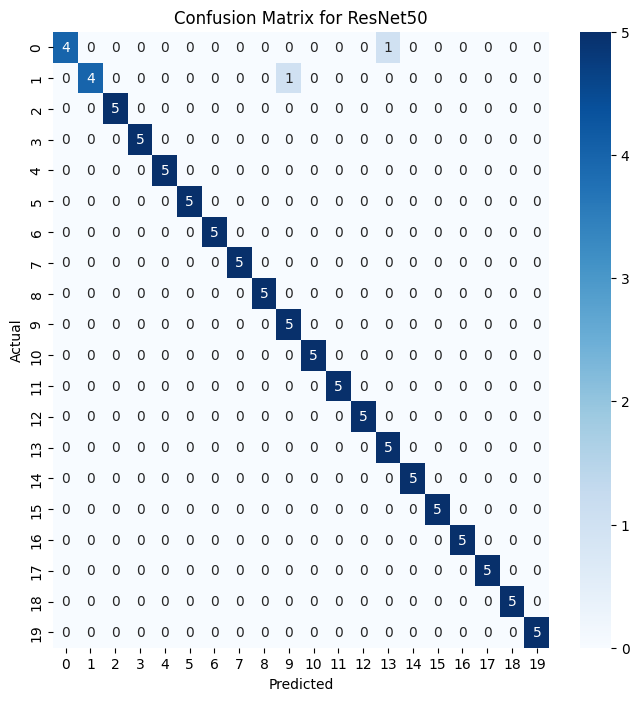

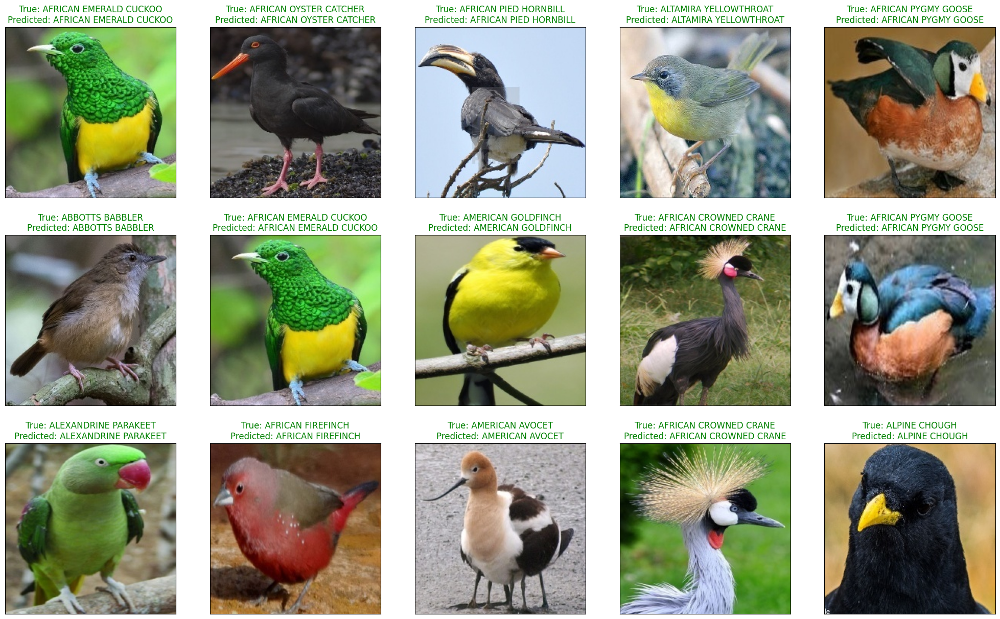

Classification Report for ResNet50:
              precision    recall  f1-score   support

           0       1.00      0.80      0.89         5
           1       1.00      0.80      0.89         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       1.00      1.00      1.00         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       0.83      1.00      0.91         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         5
          12       1.00      1.00      1.00         5
          13       0.83      1.00      0.91         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.00  

<Figure size 640x480 with 0 Axes>

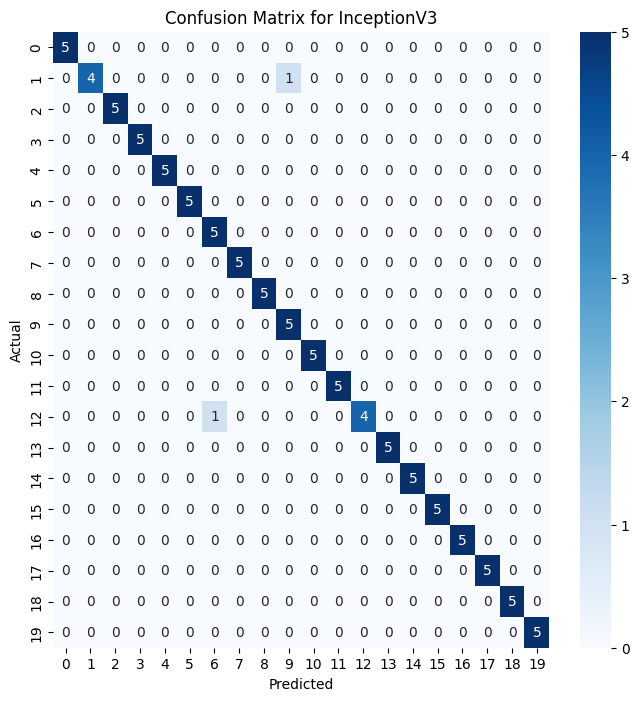

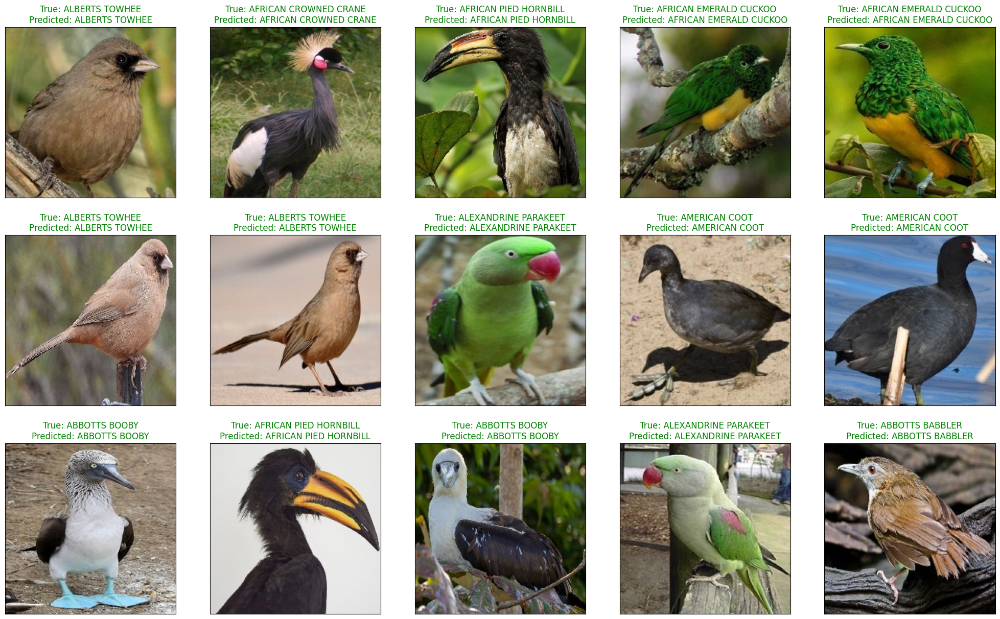

Classification Report for InceptionV3:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         5
           1       1.00      0.80      0.89         5
           2       1.00      1.00      1.00         5
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         5
           5       1.00      1.00      1.00         5
           6       0.83      1.00      0.91         5
           7       1.00      1.00      1.00         5
           8       1.00      1.00      1.00         5
           9       0.83      1.00      0.91         5
          10       1.00      1.00      1.00         5
          11       1.00      1.00      1.00         5
          12       1.00      0.80      0.89         5
          13       1.00      1.00      1.00         5
          14       1.00      1.00      1.00         5
          15       1.00      1.00      1.00         5
          16       1.00      1.00      1.0

<Figure size 640x480 with 0 Axes>

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import os.path
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


models = [vgg16_model1, resnet50_model, model_IV3]
model_names = ['VGG16', 'ResNet50', 'InceptionV3']

for idx, model in enumerate(models):
    print(f"Processing {model_names[idx]}")

    # Make predictions
    pred = model.predict(test_data)
    pred = np.argmax(pred, axis=1)

    # Get true labels from test_df
    true_labels = test_df['Label']
    label_encoder = LabelEncoder()
    true_labels_encoded = label_encoder.fit_transform(true_labels)

    # Plot confusion matrix
    cm = confusion_matrix(true_labels_encoded, pred)
    plt.figure(figsize=(8, 8))
    plt.title(f'Confusion Matrix for {model_names[idx]}')
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Display random image predictions
    random_index = np.random.randint(0, len(test_df) - 1, 15)
    fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15), subplot_kw={'xticks': [], 'yticks': []})
    for i, ax in enumerate(axes.flat):
        ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
        true_label = label_encoder.inverse_transform([true_labels_encoded[random_index[i]]])[0]
        pred_label = label_encoder.inverse_transform([pred[random_index[i]]])[0]
        if true_label == pred_label:
            color = "green"
        else:
            color = "red"
        ax.set_title(f"True: {true_label}\nPredicted: {pred_label}", color=color)
    plt.show()
    plt.tight_layout()

    # Print classification report
    print(f"Classification Report for {model_names[idx]}:")
    print(classification_report(true_labels_encoded, pred))


Overall Accuracy:
ResNet50: Achieves the highest overall accuracy of 99% among the three models.
InceptionV3: Comes next with an accuracy of 98%.
VGG16: Demonstrates an accuracy of 93%.

Precision, Recall, and F1-score:
ResNet50: Performs consistently well across precision, recall, and F1-score for most classes, showing strong results across all metrics.
InceptionV3: Also performs well, similar to ResNet50 but slightly lower on precision and recall for a few classes.
VGG16: Shows decent performance, but its accuracy and F1-score are notably lower compared to ResNet50 and InceptionV3 for several classes.

Class-wise Performance:
ResNet50 and InceptionV3: Both models display high precision, recall, and F1-score for most classes.
VGG16: Shows good precision and recall for some classes but comparatively lower performance for others, especially in recall and F1-score.

Macro and Weighted Averages:
ResNet50: Achieves higher macro and weighted averages, indicating robust performance across all classes.
InceptionV3: Follows closely in performance with slightly lower macro and weighted averages.
VGG16: Demonstrates comparatively lower macro and weighted averages, indicating some inconsistency in performance across classes.

while all models perform well, ResNet50 showcases the best overall performance, followed closely by InceptionV3, with VGG16 trailing slightly behind.

Predictions using VGG16:
1/1 [==============================] - 0s 34ms/step
Predictions using ResNet50:
1/1 [==============================] - 0s 50ms/step
Predictions using InceptionV3:
1/1 [==============================] - 0s 42ms/step


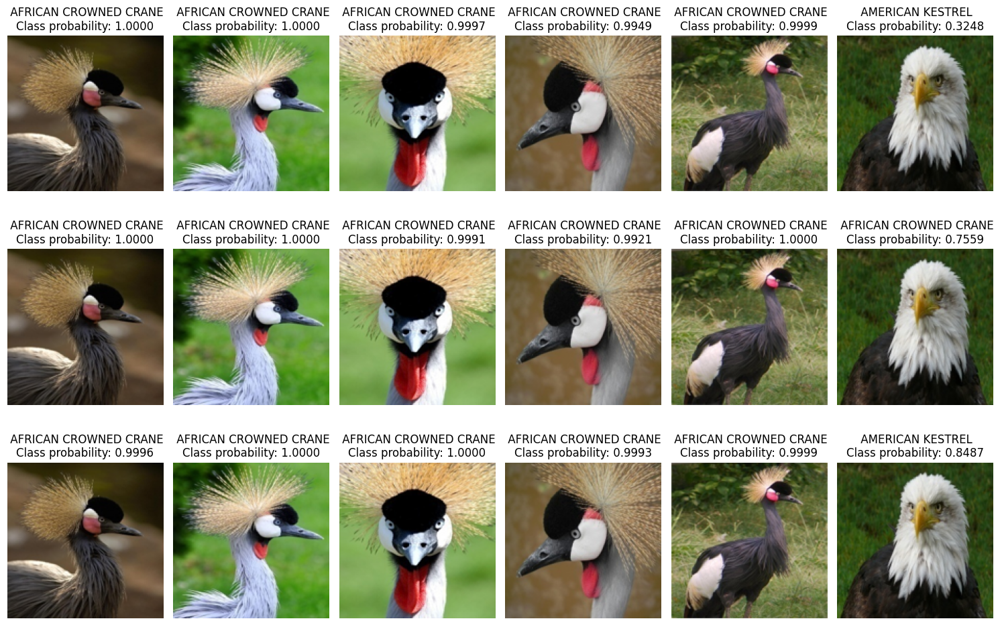

In [ ]:
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have three models named vgg16_model1, resnet50_model, and model_IV3
models = [vgg16_model1, resnet50_model, model_IV3]
model_names = ['VGG16', 'ResNet50', 'InceptionV3']

image_directory = '/content/20birdspecies/images to predict'
img_size = 150

images = []
for filename in os.listdir(image_directory):
    path = os.path.join(image_directory, filename)
    img = Image.open(path)
    img = img.resize((img_size, img_size))
    images.append(img)

images = np.array([np.array(img) for img in images])
images = images / 255.0

# labels = ['label1', 'label2', 'label3', ...]  # Assuming you have labels defined

fig, axs = plt.subplots(len(models), len(images), figsize=(15, 10))

for idx, model in enumerate(models):
    print(f"Predictions using {model_names[idx]}:")
    predictions = model.predict(images)

    for i in range(len(images)):
        predicted_class = np.argmax(predictions[i])
        class_probability = predictions[i, predicted_class]
        predicted_label = keys[predicted_class]

        # Display images and predicted classes in a grid layout
        axs[idx, i].imshow(images[i])
        axs[idx, i].axis('off')
        axs[idx, i].set_title(f' {predicted_label}\nClass probability: {class_probability:.4f}')

plt.tight_layout()
plt.show()
